<a href="https://colab.research.google.com/github/Amirhossein2034/First_Script/blob/main/ML_Final_Project_Pavement_Distress_Detection_by_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
## Upload both images
# Upload the ZIP file containing intensity images
from google.colab import files
uploaded = files.upload()
# Unzip intensity images
import zipfile
import os

intensity_zip = "intensity_images.zip"

with zipfile.ZipFile(intensity_zip, 'r') as zip_ref:
    zip_ref.extractall("intensity_images")

print("Intensity images extracted to 'intensity_images/'")
print("Files found:", os.listdir("intensity_images"))

# Upload the ZIP file containing range images
uploaded = files.upload()
# Unzip range images
range_zip = "range_images.zip"

with zipfile.ZipFile(range_zip, 'r') as zip_ref:
    zip_ref.extractall("range_images")

print("Range images extracted to 'range_images/'")
print("Files found:", os.listdir("range_images"))




Saving intensity_images.zip to intensity_images.zip
Intensity images extracted to 'intensity_images/'
Files found: ['Intensity Images']


Saving range_images.zip to range_images.zip


Range images extracted to 'range_images/'
Files found: ['Range Images']


In [6]:
import os

print("Intensity images:")
print(os.listdir('intensity_images'))

print("\nRange images:")
print(os.listdir('range_images'))


Intensity images:
['Intensity Images']

Range images:
['Range Images']


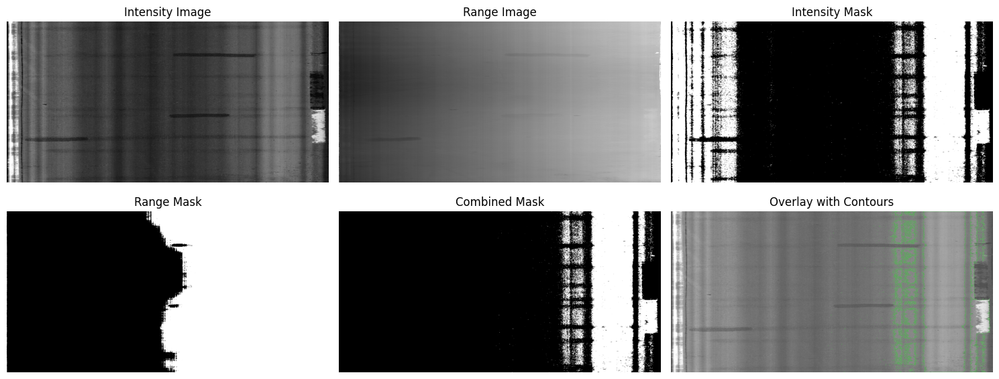

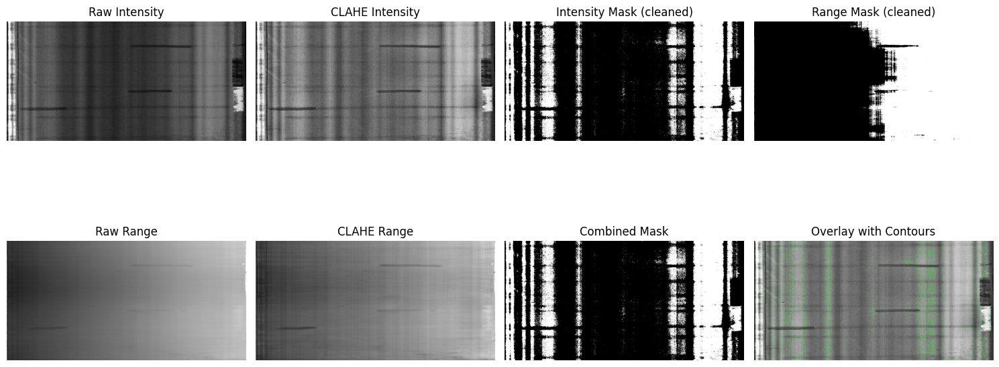

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# === Step 1: Load a matching image pair ===
filename = 'CRCP_SH288_LJ_NS_2_img_7_18.bmp'
intensity_path = os.path.join('intensity_images', 'Intensity Images', filename)
range_path = os.path.join('range_images', 'Range Images', filename)

intensity_img = cv2.imread(intensity_path, cv2.IMREAD_GRAYSCALE)
range_img = cv2.imread(range_path, cv2.IMREAD_GRAYSCALE)

if intensity_img is None or range_img is None:
    raise FileNotFoundError("Check file paths or names.")

# === Step 2: CLAHE enhancement ===
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
intensity_clahe = clahe.apply(intensity_img)
range_clahe = clahe.apply(range_img)

# === Step 3: Blur to reduce noise ===
intensity_blur = cv2.GaussianBlur(intensity_clahe, (5, 5), 0)
range_blur = cv2.GaussianBlur(range_clahe, (5, 5), 0)

# === Step 4: Otsu thresholding ===
_, intensity_mask = cv2.threshold(intensity_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
_, range_mask = cv2.threshold(range_blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# === Step 5: Morphological cleanup ===
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
intensity_mask_clean = cv2.morphologyEx(intensity_mask, cv2.MORPH_OPEN, kernel)
range_mask_clean = cv2.morphologyEx(range_mask, cv2.MORPH_OPEN, kernel)

# === Step 6: Combine masks ===

## Option A: Strict (AND logic)
# combined_mask = cv2.bitwise_and(intensity_mask_clean, range_mask_clean)

## Option B: Weighted fusion (preferred if range mask is weak)
alpha = 0.8  # intensity weight
beta = 0.2   # range weight
combined_mask = cv2.addWeighted(intensity_mask_clean, alpha, range_mask_clean, beta, 0)
_, combined_mask = cv2.threshold(combined_mask, 127, 255, cv2.THRESH_BINARY)

# === Step 7: Find and draw contours ===
contours, _ = cv2.findContours(combined_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
overlay = cv2.cvtColor(intensity_clahe, cv2.COLOR_GRAY2BGR)
cv2.drawContours(overlay, contours, -1, (0, 255, 0), 1)

# === Step 8: Visualize results ===
plt.figure(figsize=(15, 8))

plt.subplot(2, 4, 1)
plt.title("Raw Intensity")
plt.imshow(intensity_img, cmap='gray')
plt.axis("off")

plt.subplot(2, 4, 2)
plt.title("CLAHE Intensity")
plt.imshow(intensity_clahe, cmap='gray')
plt.axis("off")

plt.subplot(2, 4, 3)
plt.title("Intensity Mask (cleaned)")
plt.imshow(intensity_mask_clean, cmap='gray')
plt.axis("off")

plt.subplot(2, 4, 4)
plt.title("Range Mask (cleaned)")
plt.imshow(range_mask_clean, cmap='gray')
plt.axis("off")

plt.subplot(2, 4, 5)
plt.title("Raw Range")
plt.imshow(range_img, cmap='gray')
plt.axis("off")

plt.subplot(2, 4, 6)
plt.title("CLAHE Range")
plt.imshow(range_clahe, cmap='gray')
plt.axis("off")

plt.subplot(2, 4, 7)
plt.title("Combined Mask")
plt.imshow(combined_mask, cmap='gray')
plt.axis("off")

plt.subplot(2, 4, 8)
plt.title("Overlay with Contours")
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.tight_layout()
plt.show()


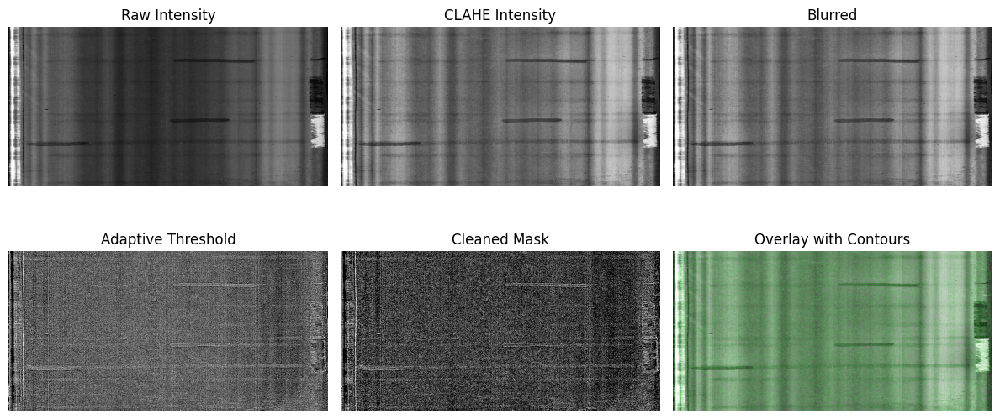

In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# === Step 1: Load intensity image only ===
filename = 'CRCP_SH288_LJ_NS_2_img_7_18.bmp'
intensity_path = os.path.join('intensity_images', 'Intensity Images', filename)
intensity_img = cv2.imread(intensity_path, cv2.IMREAD_GRAYSCALE)

if intensity_img is None:
    raise FileNotFoundError("Intensity image not found. Check path or filename.")

# === Step 2: Enhance contrast using CLAHE ===
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
intensity_clahe = clahe.apply(intensity_img)

# === Step 3: Apply Gaussian blur to denoise ===
intensity_blur = cv2.GaussianBlur(intensity_clahe, (5, 5), 0)

# === Step 4: Adaptive Thresholding ===
adaptive_mask = cv2.adaptiveThreshold(
    intensity_blur,
    maxValue=255,
    adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    thresholdType=cv2.THRESH_BINARY_INV,
    blockSize=15,
    C=2
)

# === Step 5: Morphological Cleanup ===
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
mask_clean = cv2.morphologyEx(adaptive_mask, cv2.MORPH_OPEN, kernel)

# === Step 6: Find contours and overlay ===
contours, _ = cv2.findContours(mask_clean, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
overlay = cv2.cvtColor(intensity_clahe, cv2.COLOR_GRAY2BGR)
cv2.drawContours(overlay, contours, -1, (0, 255, 0), 1)

# === Step 7: Show results ===
plt.figure(figsize=(12, 6))

plt.subplot(2, 3, 1)
plt.title("Raw Intensity")
plt.imshow(intensity_img, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 2)
plt.title("CLAHE Intensity")
plt.imshow(intensity_clahe, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 3)
plt.title("Blurred")
plt.imshow(intensity_blur, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 4)
plt.title("Adaptive Threshold")
plt.imshow(adaptive_mask, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 5)
plt.title("Cleaned Mask")
plt.imshow(mask_clean, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 6)
plt.title("Overlay with Contours")
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.tight_layout()
plt.show()


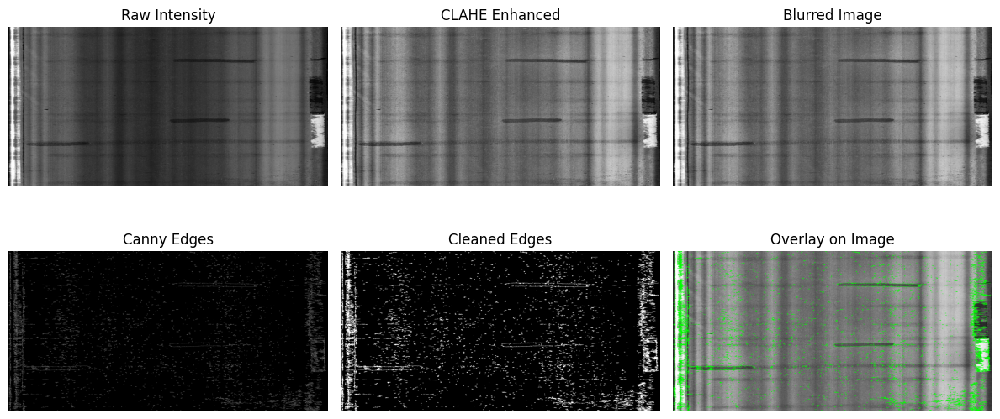

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# === Step 1: Load intensity image ===
filename = 'CRCP_SH288_LJ_NS_2_img_7_18.bmp'
intensity_path = os.path.join('intensity_images', 'Intensity Images', filename)
intensity_img = cv2.imread(intensity_path, cv2.IMREAD_GRAYSCALE)

if intensity_img is None:
    raise FileNotFoundError("Image not found. Check the filename and path.")

# === Step 2: Enhance contrast with CLAHE ===
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
intensity_clahe = clahe.apply(intensity_img)

# === Step 3: Blur to reduce noise ===
intensity_blur = cv2.GaussianBlur(intensity_clahe, (5, 5), 0)

# === Step 4: Canny Edge Detection ===
# You may adjust thresholds depending on brightness
edges = cv2.Canny(intensity_blur, threshold1=50, threshold2=150)

# === Step 5: Morphological operations to connect and clean edges ===
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
edges_clean = cv2.dilate(edges, kernel, iterations=1)
edges_clean = cv2.morphologyEx(edges_clean, cv2.MORPH_CLOSE, kernel)

# === Step 6: Overlay edges on original CLAHE image ===
overlay = cv2.cvtColor(intensity_clahe, cv2.COLOR_GRAY2BGR)
overlay[edges_clean != 0] = [0, 255, 0]  # draw edges in green

# === Step 7: Display Results ===
plt.figure(figsize=(12, 6))

plt.subplot(2, 3, 1)
plt.title("Raw Intensity")
plt.imshow(intensity_img, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 2)
plt.title("CLAHE Enhanced")
plt.imshow(intensity_clahe, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 3)
plt.title("Blurred Image")
plt.imshow(intensity_blur, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 4)
plt.title("Canny Edges")
plt.imshow(edges, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 5)
plt.title("Cleaned Edges")
plt.imshow(edges_clean, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 6)
plt.title("Overlay on Image")
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.tight_layout()
plt.show()


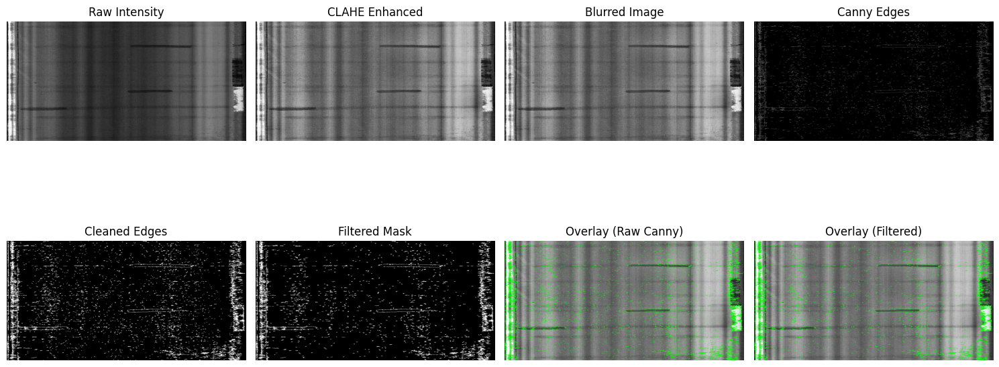

In [22]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# === Step 1: Load intensity image ===
filename = 'CRCP_SH288_LJ_NS_2_img_7_18.bmp'
intensity_path = os.path.join('intensity_images', 'Intensity Images', filename)
intensity_img = cv2.imread(intensity_path, cv2.IMREAD_GRAYSCALE)

if intensity_img is None:
    raise FileNotFoundError("Image not found. Check the path or filename.")

# === Step 2: CLAHE contrast enhancement ===
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
intensity_clahe = clahe.apply(intensity_img)

# === Step 3: Gaussian blur to reduce noise ===
intensity_blur = cv2.GaussianBlur(intensity_clahe, (5, 5), 0)

# === Step 4: Canny edge detection ===
edges = cv2.Canny(intensity_blur, threshold1=50, threshold2=150)

# === Step 5: Morphological cleanup ===
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
edges_clean = cv2.dilate(edges, kernel, iterations=1)
edges_clean = cv2.morphologyEx(edges_clean, cv2.MORPH_CLOSE, kernel)

# === Step 6: Connected component filtering ===
num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(edges_clean, connectivity=8)
filtered_mask = np.zeros_like(edges_clean)

# Filter based on area (adjust min_area as needed)
min_area = 100  # You can increase this to remove more noise
for i in range(1, num_labels):  # skip background
    area = stats[i, cv2.CC_STAT_AREA]
    if area >= min_area:
        filtered_mask[labels == i] = 255

# === Step 7: Create overlays ===
overlay_raw = cv2.cvtColor(intensity_clahe, cv2.COLOR_GRAY2BGR)
overlay_raw[edges_clean != 0] = [0, 255, 0]

overlay_filtered = cv2.cvtColor(intensity_clahe, cv2.COLOR_GRAY2BGR)
overlay_filtered[filtered_mask != 0] = [0, 255, 0]

# === Step 8: Display results ===
plt.figure(figsize=(15, 8))

plt.subplot(2, 4, 1)
plt.title("Raw Intensity")
plt.imshow(intensity_img, cmap='gray')
plt.axis("off")

plt.subplot(2, 4, 2)
plt.title("CLAHE Enhanced")
plt.imshow(intensity_clahe, cmap='gray')
plt.axis("off")

plt.subplot(2, 4, 3)
plt.title("Blurred Image")
plt.imshow(intensity_blur, cmap='gray')
plt.axis("off")

plt.subplot(2, 4, 4)
plt.title("Canny Edges")
plt.imshow(edges, cmap='gray')
plt.axis("off")

plt.subplot(2, 4, 5)
plt.title("Cleaned Edges")
plt.imshow(edges_clean, cmap='gray')
plt.axis("off")

plt.subplot(2, 4, 6)
plt.title("Filtered Mask")
plt.imshow(filtered_mask, cmap='gray')
plt.axis("off")

plt.subplot(2, 4, 7)
plt.title("Overlay (Raw Canny)")
plt.imshow(cv2.cvtColor(overlay_raw, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.subplot(2, 4, 8)
plt.title("Overlay (Filtered)")
plt.imshow(cv2.cvtColor(overlay_filtered, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.tight_layout()
plt.show()


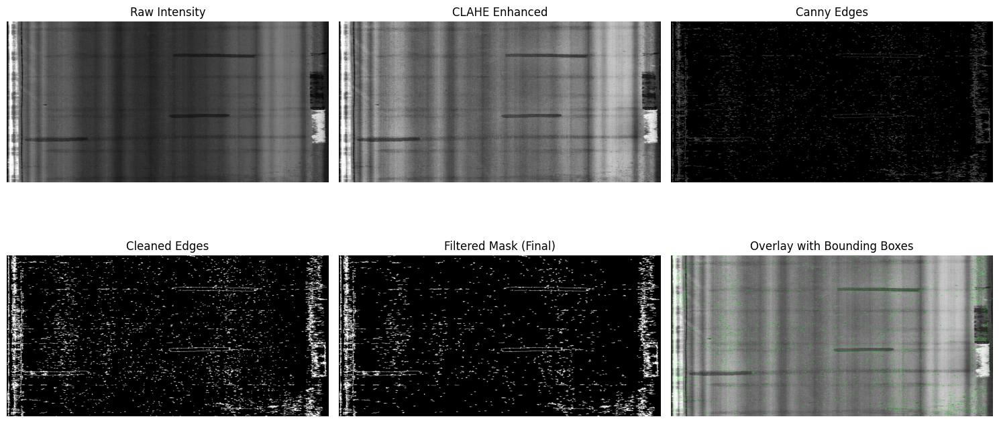

In [23]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# === Step 1: Load intensity image ===
filename = 'CRCP_SH288_LJ_NS_2_img_7_18.bmp'
intensity_path = os.path.join('intensity_images', 'Intensity Images', filename)
intensity_img = cv2.imread(intensity_path, cv2.IMREAD_GRAYSCALE)

if intensity_img is None:
    raise FileNotFoundError("Image not found. Check the path or filename.")

# === Step 2: CLAHE contrast enhancement ===
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
intensity_clahe = clahe.apply(intensity_img)

# === Step 3: Gaussian blur to reduce noise ===
intensity_blur = cv2.GaussianBlur(intensity_clahe, (5, 5), 0)

# === Step 4: Canny edge detection ===
edges = cv2.Canny(intensity_blur, threshold1=50, threshold2=150)

# === Step 5: Morphological cleanup ===
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
edges_clean = cv2.dilate(edges, kernel, iterations=1)
edges_clean = cv2.morphologyEx(edges_clean, cv2.MORPH_CLOSE, kernel)

# === Step 6: Connected component filtering with area, width, height ===
num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(edges_clean, connectivity=8)
filtered_mask = np.zeros_like(edges_clean)
bounding_boxes = []

# Parameters for filtering
min_area = 100     # Minimum component size
min_width = 10     # Minimum width of detected box
min_height = 5     # Minimum height of detected box

for i in range(1, num_labels):  # skip background
    x, y, w, h, area = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], \
                      stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT], \
                      stats[i, cv2.CC_STAT_AREA]

    if area >= min_area and w >= min_width and h >= min_height:
        filtered_mask[labels == i] = 255
        bounding_boxes.append((x, y, w, h, area))

# === Step 7: Draw bounding boxes on overlay ===
overlay_filtered = cv2.cvtColor(intensity_clahe, cv2.COLOR_GRAY2BGR)

for x, y, w, h, area in bounding_boxes:
    cv2.rectangle(overlay_filtered, (x, y), (x + w, y + h), (0, 255, 0), 1)
    # Optional: label area value
    # cv2.putText(overlay_filtered, f"{area}", (x, y - 3), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 255, 0), 1)

# === Step 8: Display results ===
plt.figure(figsize=(15, 8))

plt.subplot(2, 3, 1)
plt.title("Raw Intensity")
plt.imshow(intensity_img, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 2)
plt.title("CLAHE Enhanced")
plt.imshow(intensity_clahe, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 3)
plt.title("Canny Edges")
plt.imshow(edges, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 4)
plt.title("Cleaned Edges")
plt.imshow(edges_clean, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 5)
plt.title("Filtered Mask (Final)")
plt.imshow(filtered_mask, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 6)
plt.title("Overlay with Bounding Boxes")
plt.imshow(cv2.cvtColor(overlay_filtered, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.tight_layout()
plt.show()


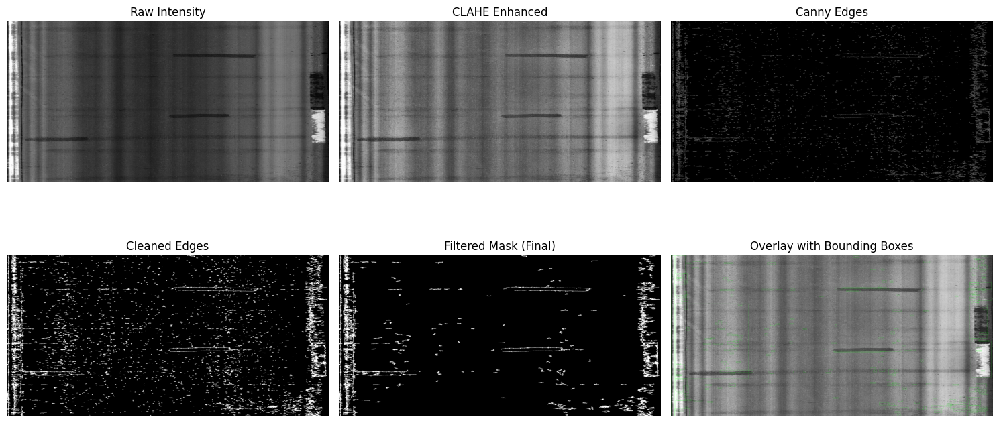

In [26]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# === Step 1: Load intensity image ===
filename = 'CRCP_SH288_LJ_NS_2_img_7_18.bmp'
intensity_path = os.path.join('intensity_images', 'Intensity Images', filename)
intensity_img = cv2.imread(intensity_path, cv2.IMREAD_GRAYSCALE)

if intensity_img is None:
    raise FileNotFoundError("Image not found. Check the path or filename.")

# === Step 2: CLAHE contrast enhancement ===
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
intensity_clahe = clahe.apply(intensity_img)

# === Step 3: Gaussian blur to reduce noise ===
intensity_blur = cv2.GaussianBlur(intensity_clahe, (5, 5), 0)

# === Step 4: Canny edge detection ===
edges = cv2.Canny(intensity_blur, threshold1=50, threshold2=150)

# === Step 5: Morphological cleanup ===
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
edges_clean = cv2.dilate(edges, kernel, iterations=1)
edges_clean = cv2.morphologyEx(edges_clean, cv2.MORPH_CLOSE, kernel)

# === Step 6: Connected component filtering with area, width, height ===
num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(edges_clean, connectivity=8)
filtered_mask = np.zeros_like(edges_clean)
bounding_boxes = []

# Parameters for filtering
min_area = 300     # Minimum component size
min_width = 20     # Minimum width of detected box
min_height = 10     # Minimum height of detected box

for i in range(1, num_labels):  # skip background
    x, y, w, h, area = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], \
                      stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT], \
                      stats[i, cv2.CC_STAT_AREA]

    if area >= min_area and w >= min_width and h >= min_height:
        filtered_mask[labels == i] = 255
        bounding_boxes.append((x, y, w, h, area))

# === Step 7: Draw bounding boxes on overlay ===
overlay_filtered = cv2.cvtColor(intensity_clahe, cv2.COLOR_GRAY2BGR)

for x, y, w, h, area in bounding_boxes:
    cv2.rectangle(overlay_filtered, (x, y), (x + w, y + h), (0, 255, 0), 1)
    # Optional: label area value
    # cv2.putText(overlay_filtered, f"{area}", (x, y - 3), cv2.FONT_HERSHEY_SIMPLEX, 0.3, (255, 255, 0), 1)

# === Step 8: Display results ===
plt.figure(figsize=(15, 8))

plt.subplot(2, 3, 1)
plt.title("Raw Intensity")
plt.imshow(intensity_img, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 2)
plt.title("CLAHE Enhanced")
plt.imshow(intensity_clahe, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 3)
plt.title("Canny Edges")
plt.imshow(edges, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 4)
plt.title("Cleaned Edges")
plt.imshow(edges_clean, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 5)
plt.title("Filtered Mask (Final)")
plt.imshow(filtered_mask, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 6)
plt.title("Overlay with Bounding Boxes")
plt.imshow(cv2.cvtColor(overlay_filtered, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.tight_layout()
plt.show()

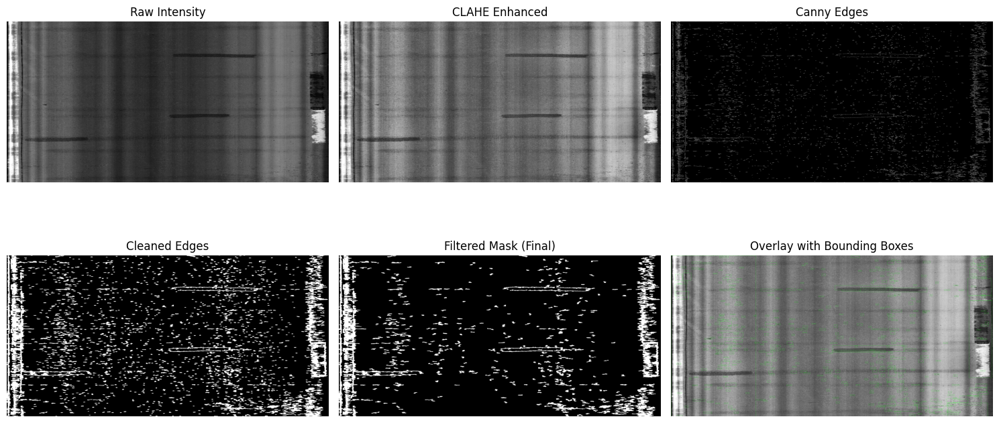

In [27]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# === Load image ===
filename = 'CRCP_SH288_LJ_NS_2_img_7_18.bmp'
intensity_path = os.path.join('intensity_images', 'Intensity Images', filename)
intensity_img = cv2.imread(intensity_path, cv2.IMREAD_GRAYSCALE)

if intensity_img is None:
    raise FileNotFoundError("Check path and filename.")

# === CLAHE Enhancement ===
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
intensity_clahe = clahe.apply(intensity_img)

# === Gaussian Blur ===
intensity_blur = cv2.GaussianBlur(intensity_clahe, (5, 5), 0)

# === Canny Edge Detection ===
edges = cv2.Canny(intensity_blur, threshold1=50, threshold2=150)

# === Morphology: use larger kernel + more aggressive closing ===
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (7, 3))  # wider horizontal crack-friendly
edges_clean = cv2.dilate(edges, kernel, iterations=2)
edges_clean = cv2.morphologyEx(edges_clean, cv2.MORPH_CLOSE, kernel)

# === Connected Components Filtering (Strict) ===
num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(edges_clean, connectivity=8)
filtered_mask = np.zeros_like(edges_clean)
bounding_boxes = []

# Adjusted thresholds for stricter selection
min_area = 400
min_width = 30
min_height = 10

for i in range(1, num_labels):
    x, y, w, h, area = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], \
                      stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT], \
                      stats[i, cv2.CC_STAT_AREA]

    if area >= min_area and w >= min_width and h >= min_height:
        filtered_mask[labels == i] = 255
        bounding_boxes.append((x, y, w, h, area))

# === Draw Bounding Boxes ===
overlay_filtered = cv2.cvtColor(intensity_clahe, cv2.COLOR_GRAY2BGR)

for x, y, w, h, area in bounding_boxes:
    cv2.rectangle(overlay_filtered, (x, y), (x + w, y + h), (0, 255, 0), 1)

# === Plot Results ===
plt.figure(figsize=(15, 8))

plt.subplot(2, 3, 1)
plt.title("Raw Intensity")
plt.imshow(intensity_img, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 2)
plt.title("CLAHE Enhanced")
plt.imshow(intensity_clahe, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 3)
plt.title("Canny Edges")
plt.imshow(edges, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 4)
plt.title("Cleaned Edges")
plt.imshow(edges_clean, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 5)
plt.title("Filtered Mask (Final)")
plt.imshow(filtered_mask, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 6)
plt.title("Overlay with Bounding Boxes")
plt.imshow(cv2.cvtColor(overlay_filtered, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.tight_layout()
plt.show()


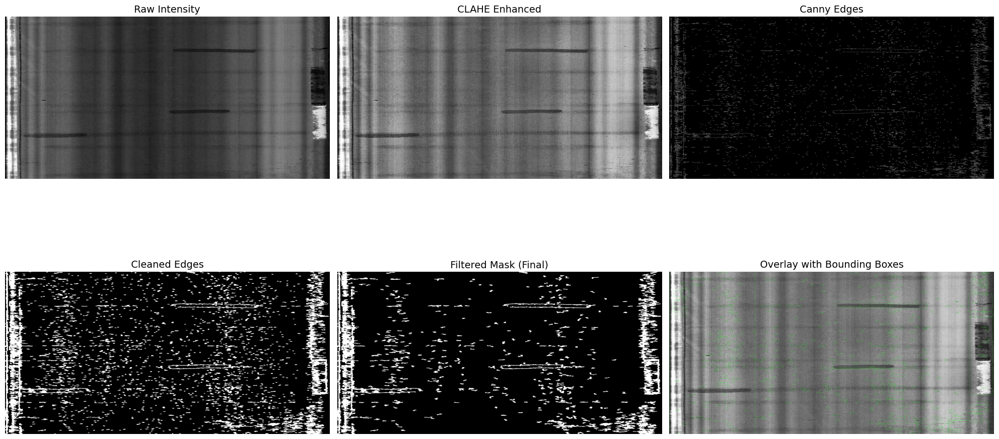

In [28]:
# === Plot Results (Bigger Images, 2 rows x 3 columns) ===
plt.figure(figsize=(20, 12))  # Wider and taller figure

plt.subplot(2, 3, 1)
plt.title("Raw Intensity", fontsize=14)
plt.imshow(intensity_img, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 2)
plt.title("CLAHE Enhanced", fontsize=14)
plt.imshow(intensity_clahe, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 3)
plt.title("Canny Edges", fontsize=14)
plt.imshow(edges, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 4)
plt.title("Cleaned Edges", fontsize=14)
plt.imshow(edges_clean, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 5)
plt.title("Filtered Mask (Final)", fontsize=14)
plt.imshow(filtered_mask, cmap='gray')
plt.axis("off")

plt.subplot(2, 3, 6)
plt.title("Overlay with Bounding Boxes", fontsize=14)
plt.imshow(cv2.cvtColor(overlay_filtered, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.tight_layout()
plt.show()


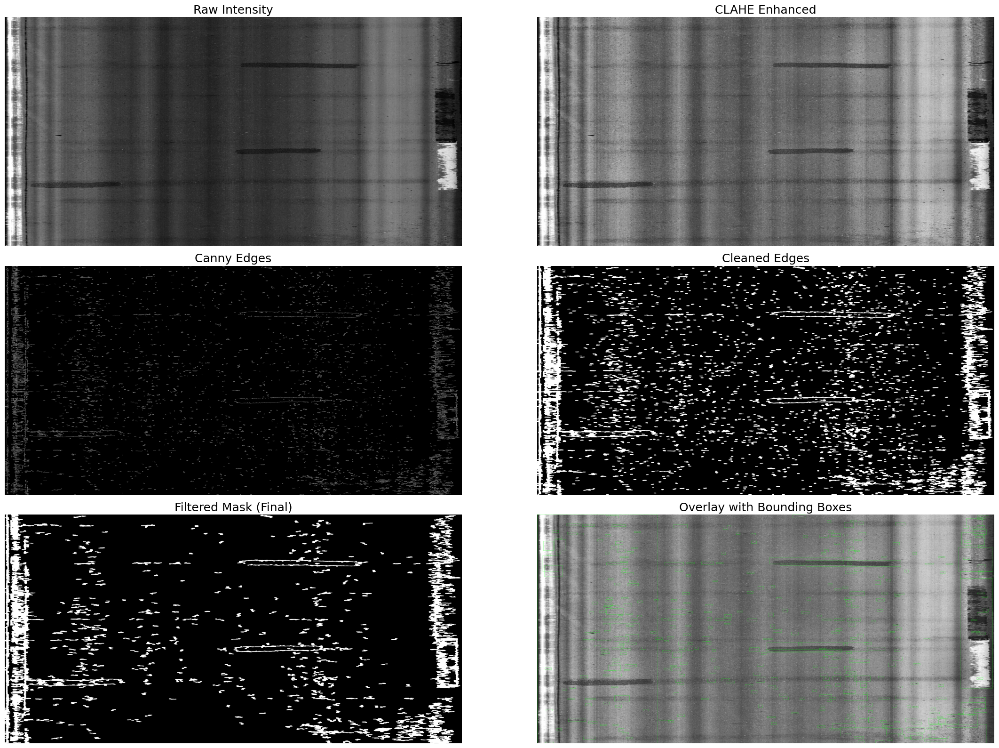

In [29]:
# === Plot Results (Ultra Large - 2 columns x 3 rows) ===
plt.figure(figsize=(24, 16))  # Huge canvas

titles = [
    "Raw Intensity",
    "CLAHE Enhanced",
    "Canny Edges",
    "Cleaned Edges",
    "Filtered Mask (Final)",
    "Overlay with Bounding Boxes"
]

images = [
    intensity_img,
    intensity_clahe,
    edges,
    edges_clean,
    filtered_mask,
    cv2.cvtColor(overlay_filtered, cv2.COLOR_BGR2RGB)
]

for i in range(6):
    plt.subplot(3, 2, i + 1)
    plt.title(titles[i], fontsize=18)
    cmap = 'gray' if i != 5 else None
    plt.imshow(images[i], cmap=cmap)
    plt.axis("off")

plt.tight_layout()
plt.show()


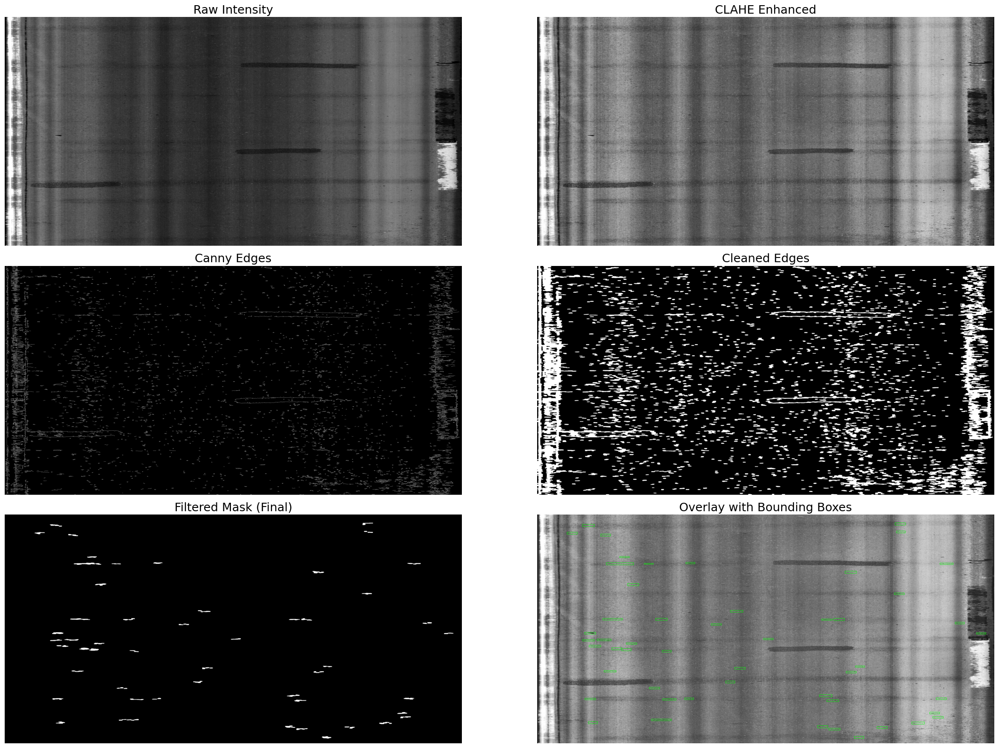

In [30]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# === Step 1: Load intensity image ===
filename = 'CRCP_SH288_LJ_NS_2_img_7_18.bmp'
intensity_path = os.path.join('intensity_images', 'Intensity Images', filename)
intensity_img = cv2.imread(intensity_path, cv2.IMREAD_GRAYSCALE)

if intensity_img is None:
    raise FileNotFoundError("Image not found. Check the filename and path.")

# === Step 2: CLAHE enhancement ===
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
intensity_clahe = clahe.apply(intensity_img)

# === Step 3: Blur to reduce noise ===
intensity_blur = cv2.GaussianBlur(intensity_clahe, (5, 5), 0)

# === Step 4: Canny edge detection ===
edges = cv2.Canny(intensity_blur, threshold1=50, threshold2=150)

# === Step 5: Morphological operations (horizontal structure) ===
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (9, 3))
edges_clean = cv2.dilate(edges, kernel, iterations=2)
edges_clean = cv2.morphologyEx(edges_clean, cv2.MORPH_CLOSE, kernel)

# === Step 6: Connected Components Filtering (strict for horizontal joints/cracks) ===
num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(edges_clean, connectivity=8)
filtered_mask = np.zeros_like(edges_clean)
bounding_boxes = []

# Strict geometric rules for "horizontal distress"
min_area = 500
min_width = 80
max_height = 20
min_aspect_ratio = 4.0  # width / height

for i in range(1, num_labels):
    x, y, w, h, area = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], \
                      stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT], \
                      stats[i, cv2.CC_STAT_AREA]

    aspect_ratio = w / h if h > 0 else 0

    if area >= min_area and w >= min_width and h <= max_height and aspect_ratio >= min_aspect_ratio:
        filtered_mask[labels == i] = 255
        bounding_boxes.append((x, y, w, h, area))

# === Step 7: Draw bounding boxes on overlay ===
overlay_filtered = cv2.cvtColor(intensity_clahe, cv2.COLOR_GRAY2BGR)
for x, y, w, h, area in bounding_boxes:
    cv2.rectangle(overlay_filtered, (x, y), (x + w, y + h), (0, 255, 0), 2)

# === Step 8: Display results in large format ===
plt.figure(figsize=(24, 16))  # very large display

titles = [
    "Raw Intensity",
    "CLAHE Enhanced",
    "Canny Edges",
    "Cleaned Edges",
    "Filtered Mask (Final)",
    "Overlay with Bounding Boxes"
]

images = [
    intensity_img,
    intensity_clahe,
    edges,
    edges_clean,
    filtered_mask,
    cv2.cvtColor(overlay_filtered, cv2.COLOR_BGR2RGB)
]

for i in range(6):
    plt.subplot(3, 2, i + 1)
    plt.title(titles[i], fontsize=18)
    cmap = 'gray' if i != 5 else None
    plt.imshow(images[i], cmap=cmap)
    plt.axis("off")

plt.tight_layout()
plt.show()


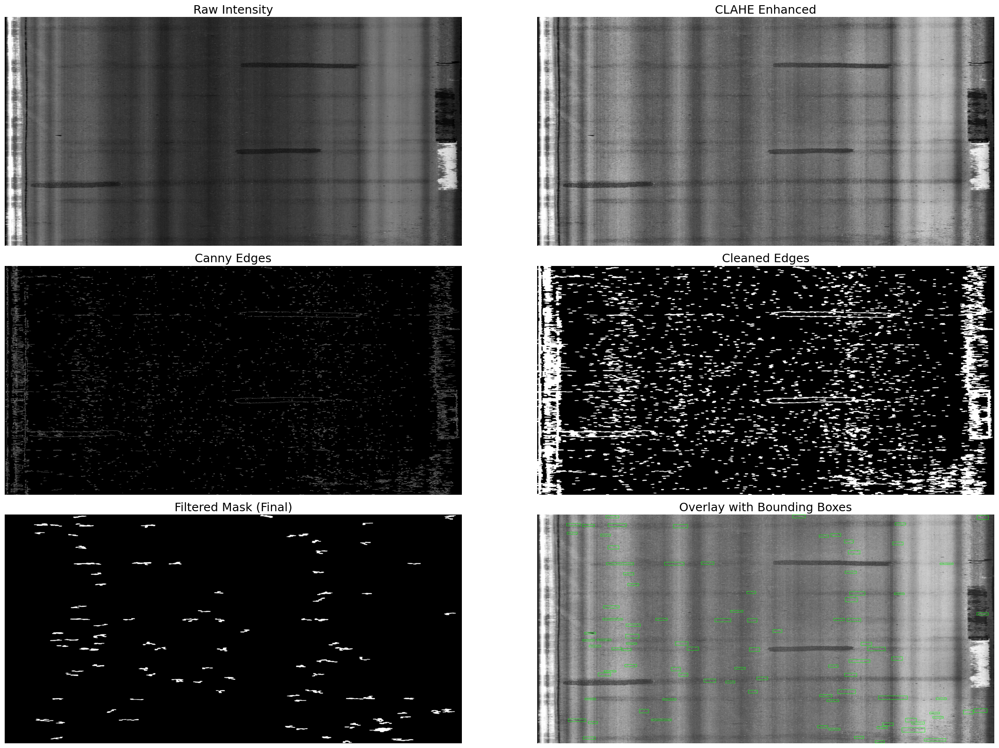

In [31]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# === Step 1: Load intensity image ===
filename = 'CRCP_SH288_LJ_NS_2_img_7_18.bmp'
intensity_path = os.path.join('intensity_images', 'Intensity Images', filename)
intensity_img = cv2.imread(intensity_path, cv2.IMREAD_GRAYSCALE)

if intensity_img is None:
    raise FileNotFoundError("Image not found. Check the path and filename.")

# === Step 2: CLAHE enhancement ===
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
intensity_clahe = clahe.apply(intensity_img)

# === Step 3: Gaussian blur ===
intensity_blur = cv2.GaussianBlur(intensity_clahe, (5, 5), 0)

# === Step 4: Canny edge detection ===
edges = cv2.Canny(intensity_blur, threshold1=50, threshold2=150)

# === Step 5: Morphological cleanup (emphasize horizontal structures) ===
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (9, 3))
edges_clean = cv2.dilate(edges, kernel, iterations=2)
edges_clean = cv2.morphologyEx(edges_clean, cv2.MORPH_CLOSE, kernel)

# === Step 6: Connected component filtering (balanced detection) ===
num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(edges_clean, connectivity=8)
filtered_mask = np.zeros_like(edges_clean)
bounding_boxes = []

# Balanced parameters (adjusted for best joint/crack capture)
min_area = 800
min_width = 80
max_height = 40
min_aspect_ratio = 2.5

for i in range(1, num_labels):  # Skip background
    x, y, w, h, area = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], \
                      stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT], \
                      stats[i, cv2.CC_STAT_AREA]

    aspect_ratio = w / h if h > 0 else 0

    if area >= min_area and w >= min_width and h <= max_height and aspect_ratio >= min_aspect_ratio:
        filtered_mask[labels == i] = 255
        bounding_boxes.append((x, y, w, h, area))

# === Step 7: Draw bounding boxes on overlay ===
overlay_filtered = cv2.cvtColor(intensity_clahe, cv2.COLOR_GRAY2BGR)
for x, y, w, h, area in bounding_boxes:
    cv2.rectangle(overlay_filtered, (x, y), (x + w, y + h), (0, 255, 0), 2)

# === Step 8: Show results with high visibility ===
plt.figure(figsize=(24, 16))  # Extra large figure for inspection

titles = [
    "Raw Intensity",
    "CLAHE Enhanced",
    "Canny Edges",
    "Cleaned Edges",
    "Filtered Mask (Final)",
    "Overlay with Bounding Boxes"
]

images = [
    intensity_img,
    intensity_clahe,
    edges,
    edges_clean,
    filtered_mask,
    cv2.cvtColor(overlay_filtered, cv2.COLOR_BGR2RGB)
]

for i in range(6):
    plt.subplot(3, 2, i + 1)
    plt.title(titles[i], fontsize=18)
    cmap = 'gray' if i != 5 else None
    plt.imshow(images[i], cmap=cmap)
    plt.axis("off")

plt.tight_layout()
plt.show()


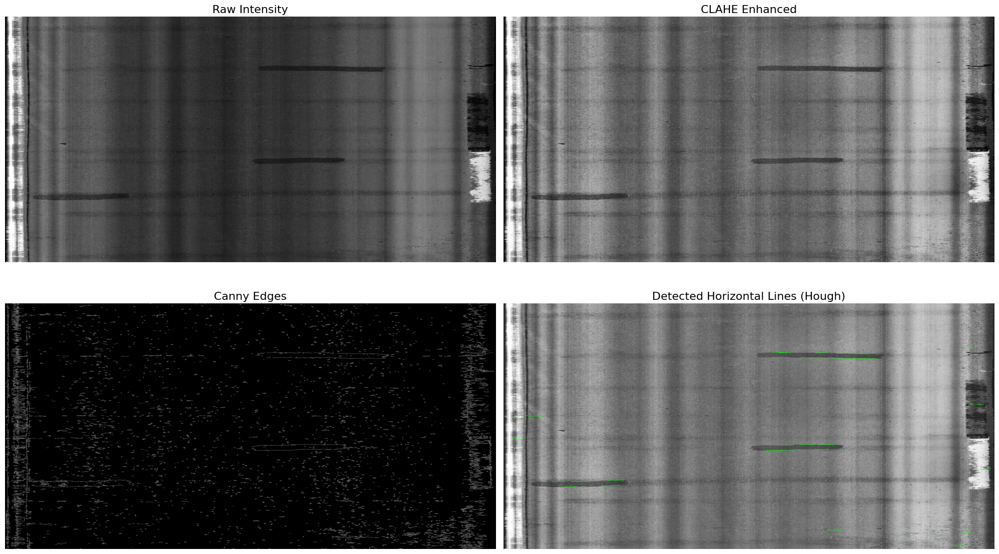

In [32]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# === Step 1: Load intensity image ===
filename = 'CRCP_SH288_LJ_NS_2_img_7_18.bmp'
intensity_path = os.path.join('intensity_images', 'Intensity Images', filename)
intensity_img = cv2.imread(intensity_path, cv2.IMREAD_GRAYSCALE)

if intensity_img is None:
    raise FileNotFoundError("Image not found. Check the filename and path.")

# === Step 2: CLAHE contrast enhancement ===
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
intensity_clahe = clahe.apply(intensity_img)

# === Step 3: Gaussian blur to denoise ===
intensity_blur = cv2.GaussianBlur(intensity_clahe, (5, 5), 0)

# === Step 4: Canny edge detection ===
edges = cv2.Canny(intensity_blur, 50, 150)

# === Step 5: Detect horizontal lines using Hough Line Transform ===
# You can tune minLineLength and maxLineGap for better results
lines = cv2.HoughLinesP(
    edges,
    rho=1,
    theta=np.pi / 180,
    threshold=80,         # minimum votes
    minLineLength=100,    # minimum length of line
    maxLineGap=20         # maximum allowed gap between line segments to treat as single line
)

# === Step 6: Draw detected lines on overlay ===
overlay = cv2.cvtColor(intensity_clahe, cv2.COLOR_GRAY2BGR)
if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        if abs(y2 - y1) < 10:  # keep mostly horizontal lines only
            cv2.line(overlay, (x1, y1), (x2, y2), (0, 255, 0), 2)

# === Step 7: Display Results ===
plt.figure(figsize=(20, 12))

plt.subplot(2, 2, 1)
plt.title("Raw Intensity", fontsize=16)
plt.imshow(intensity_img, cmap='gray')
plt.axis("off")

plt.subplot(2, 2, 2)
plt.title("CLAHE Enhanced", fontsize=16)
plt.imshow(intensity_clahe, cmap='gray')
plt.axis("off")

plt.subplot(2, 2, 3)
plt.title("Canny Edges", fontsize=16)
plt.imshow(edges, cmap='gray')
plt.axis("off")

plt.subplot(2, 2, 4)
plt.title("Detected Horizontal Lines (Hough)", fontsize=16)
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.tight_layout()
plt.show()


✅ Line data saved to: /content/detected_lines.csv


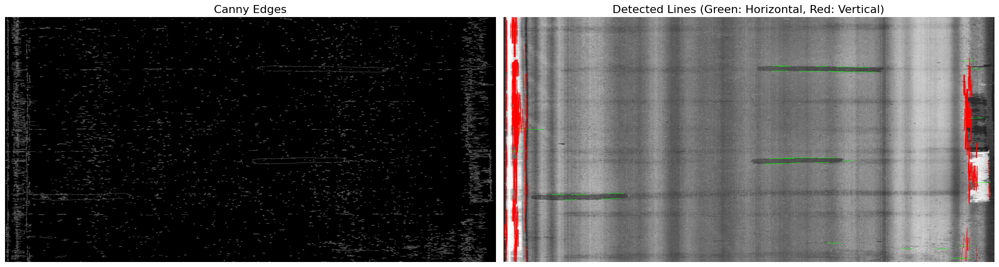

In [33]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd

# === Step 1: Load image ===
filename = 'CRCP_SH288_LJ_NS_2_img_7_18.bmp'
intensity_path = os.path.join('intensity_images', 'Intensity Images', filename)
intensity_img = cv2.imread(intensity_path, cv2.IMREAD_GRAYSCALE)

if intensity_img is None:
    raise FileNotFoundError("Image not found. Check the path or filename.")

# === Step 2: CLAHE enhancement ===
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
intensity_clahe = clahe.apply(intensity_img)

# === Step 3: Gaussian blur ===
intensity_blur = cv2.GaussianBlur(intensity_clahe, (5, 5), 0)

# === Step 4: Canny edge detection ===
edges = cv2.Canny(intensity_blur, threshold1=50, threshold2=150)

# === Step 5: Hough Line detection (all lines) ===
lines = cv2.HoughLinesP(
    edges,
    rho=1,
    theta=np.pi / 180,
    threshold=80,
    minLineLength=100,
    maxLineGap=20
)

# === Step 6: Draw classified lines and collect data ===
overlay = cv2.cvtColor(intensity_clahe, cv2.COLOR_GRAY2BGR)
line_data = []

if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        dx = abs(x2 - x1)
        dy = abs(y2 - y1)
        length = np.sqrt(dx**2 + dy**2)

        if dy <= 10:  # horizontal
            orientation = 'horizontal'
            color = (0, 255, 0)  # green
        elif dx <= 10:  # vertical
            orientation = 'vertical'
            color = (0, 0, 255)  # red
        else:
            continue  # skip diagonal or short irrelevant lines

        cv2.line(overlay, (x1, y1), (x2, y2), color, 2)
        line_data.append({
            'x1': x1, 'y1': y1, 'x2': x2, 'y2': y2,
            'length': round(length, 2),
            'orientation': orientation
        })

# === Step 7: Save line data to CSV ===
df = pd.DataFrame(line_data)
csv_output_path = '/content/detected_lines.csv'
df.to_csv(csv_output_path, index=False)
print(f"✅ Line data saved to: {csv_output_path}")

# === Step 8: Show results ===
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.title("Canny Edges", fontsize=16)
plt.imshow(edges, cmap='gray')
plt.axis("off")

plt.subplot(1, 2, 2)
plt.title("Detected Lines (Green: Horizontal, Red: Vertical)", fontsize=16)
plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
plt.axis("off")

plt.tight_layout()
plt.show()
